In [2]:
import pandas as pd

In [3]:
df = pd.read_excel('../../data_set/monthlyInvestigation/cleaned_monthly_investigations.xlsx')

Original class distribution:
Risk_Label
1    184
0    104
Name: count, dtype: int64


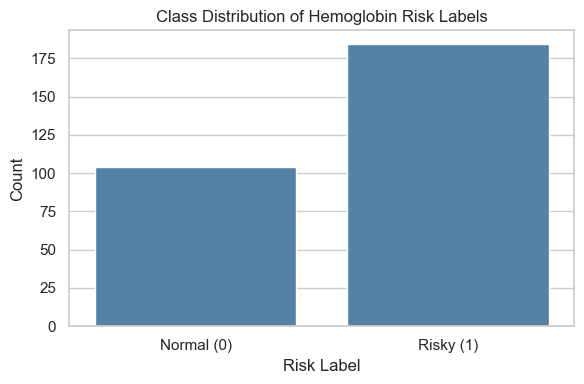

In [4]:
import numpy as np
import pandas as pd
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.utils import resample
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support
from sklearn.model_selection import GroupShuffleSplit

# -----------------------------
# 1. Data Preparation + Feature Engineering
# -----------------------------
df.sort_values(['Subject_ID', 'Month'], inplace=True)
df['Next_Hb'] = df.groupby('Subject_ID')['Hb (g/dL)'].shift(-1)
df['Risk_Label'] = df['Next_Hb'].apply(lambda x: 1 if x < 10 or x > 12 else 0)
df['Hb_diff'] = df['Hb (g/dL)'] - df.groupby('Subject_ID')['Hb (g/dL)'].shift(1)
df = df.dropna(subset=['Next_Hb', 'Risk_Label'])

# Feature Engineering placeholder (you can enhance this further)
df['Albumin_BU_Ratio'] = df['Albumin (g/L)'] / (df['BU - pre HD'] + 1)
df['K_Diff'] = df['Serum K Post-HD (mmol/L)'] - df['Serum K Pre-HD (mmol/L)']

feature_cols = [
    'Albumin (g/L)', 'BU - post HD', 'BU - pre HD', 'S Ca (mmol/L)',
    'Serum K Post-HD (mmol/L)', 'Serum K Pre-HD (mmol/L)',
    'Serum Na Pre-HD (mmol/L)', 'UA (mg/dL)', 'Hb_diff', 'Hb (g/dL)',
    'Albumin_BU_Ratio', 'K_Diff'
]

# -----------------------------
# 2. Group-aware Train-Test Split
# -----------------------------
gss = GroupShuffleSplit(n_splits=1, test_size=0.2, random_state=42)
train_idx, test_idx = next(gss.split(df, groups=df['Subject_ID']))

train_df = df.iloc[train_idx].copy()
test_df = df.iloc[test_idx].copy()

# -----------------------------
# 3. Undersampling to Address Imbalance
# -----------------------------
df_minority = train_df[train_df.Risk_Label == 0]  # minority class (class 0)
df_majority = train_df[train_df.Risk_Label == 1]  # majority class (class 1)

print(f"Original class distribution:\n{train_df['Risk_Label'].value_counts()}")

target_majority_count = int(len(df_minority) * 1)  # 10% more than minority

# df_majority_downsampled = resample(
#     df_majority,
#     replace=False,
#     n_samples=target_majority_count,
#     random_state=42
# )

# train_df_balanced = pd.concat([df_minority, df_majority_downsampled])
# train_df_balanced = train_df_balanced.sample(frac=1, random_state=42)  # Shuffle

# print(f"Balanced class distribution:\n{train_df_balanced['Risk_Label'].value_counts()}")

import matplotlib.pyplot as plt
import seaborn as sns

# Set plotting style
sns.set(style="whitegrid", )

# Plot class distribution before balancing
plt.figure(figsize=(6, 4),)
sns.countplot(data=train_df, x='Risk_Label',color='steelblue')
plt.title('Class Distribution of Hemoglobin Risk Labels')
plt.xlabel('Risk Label')
plt.ylabel('Count')
plt.xticks(ticks=[0, 1], labels=['Normal (0)', 'Risky (1)'])
plt.tight_layout()
plt.show()

In [7]:
from xgboost import XGBClassifier
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.metrics import classification_report, confusion_matrix

X_train = train_df[feature_cols]
y_train = train_df['Risk_Label']
X_test = test_df[feature_cols]
y_test = test_df['Risk_Label']
# Compute sample weights for class imbalance
sample_weights = compute_sample_weight(class_weight='balanced', y=y_train)

# -----------------------------
# 5. Train XGBoost Model
# -----------------------------
xgb_model = XGBClassifier(
    objective='binary:logistic',
    use_label_encoder=False,
    eval_metric='logloss',
    learning_rate=0.01,
    max_depth=50,
    n_estimators=500,
    subsample=1.0,
    colsample_bytree=1.0,
    random_state=42,
    scale_pos_weight=0.7,
    reg_alpha=1, reg_lambda=2
)
xgb_model.fit(X_train, y_train,eval_set=[(X_test, y_test)],
    verbose=False)
xgb_probs = xgb_model.predict_proba(X_test)[:, 1]
# XGBoost performance
xgb_pred = (xgb_probs >= 0.5).astype(int)
print("\nXGBoost Report:\n", classification_report(y_test, xgb_pred))

# -----------------------------
# 6. Train LightGBM Model
# -----------------------------
lgbm_model = LGBMClassifier(
    objective='binary',
    learning_rate=0.001,
    n_estimators=500,
    max_depth=500,
    subsample=1.0,
    colsample_bytree=1.0,
    random_state=42,

)
lgbm_model.fit( X_train, y_train,
    eval_set=[(X_test, y_test)],
    eval_metric='binary_logloss',
)
lgbm_probs = lgbm_model.predict_proba(X_test)[:, 1]
# LightGBM performance
lgbm_pred = (lgbm_probs >= 0.5).astype(int)
print("\nLightGBM Report:\n", classification_report(y_test, lgbm_pred))

# -----------------------------
# 7. Combine Probabilities (Soft Voting)
# -----------------------------
probs_ens = 0.2 * xgb_probs + 0.8 * lgbm_probs

# -----------------------------
# 8. Threshold Tuning (Maximize Recall for Class 0)
# -----------------------------
best_recall_1 = 0.5
best_thresh = 0.5

for thresh in np.linspace(0.1, 0.9, 20000):
    y_pred_thresh = (probs_ens >= thresh).astype(int)
    precision, recall, f1, _ = precision_recall_fscore_support(
        y_test, y_pred_thresh, average=None, labels=[0, 1]
    )
    recall_0, recall_1 = recall
    if recall_1 > best_recall_1 and recall_0 >= 0.60:  # slight tolerance for class 0
        best_recall_1 = recall_1
        best_thresh = thresh

# print(f"\n✅ Optimal Ensemble Threshold: {best_thresh:.3f} (Recall Class 0: {best_recall_0:.2f})")

# -----------------------------
# 9. Final Evaluation
# -----------------------------
y_pred_ens = (probs_ens >= best_thresh).astype(int)

print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_ens))
print("\nClassification Report:\n", classification_report(y_test, y_pred_ens))


c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\xgboost\training.py:183: UserWarning: [19:04:24] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)



XGBoost Report:
               precision    recall  f1-score   support

           0       0.53      0.57      0.55        30
           1       0.64      0.61      0.62        38

    accuracy                           0.59        68
   macro avg       0.59      0.59      0.59        68
weighted avg       0.59      0.59      0.59        68

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Number of positive: 184, number of negative: 104
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000111 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 817
[LightGBM] [Info] Number of data points in the train set: 288, number of used features: 12
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.638889 -> initscore=0.570545
[LightGBM] [Info] Start training from score 0.570545
[LightGBM]

c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif


Confusion Matrix:
 [[18 12]
 [11 27]]

Classification Report:
               precision    recall  f1-score   support

           0       0.62      0.60      0.61        30
           1       0.69      0.71      0.70        38

    accuracy                           0.66        68
   macro avg       0.66      0.66      0.66        68
weighted avg       0.66      0.66      0.66        68



In [8]:
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_ens))
print("\nClassification Report:\n", classification_report(y_test, y_pred_ens))


Confusion Matrix:
 [[18 12]
 [11 27]]

Classification Report:
               precision    recall  f1-score   support

           0       0.62      0.60      0.61        30
           1       0.69      0.71      0.70        38

    accuracy                           0.66        68
   macro avg       0.66      0.66      0.66        68
weighted avg       0.66      0.66      0.66        68



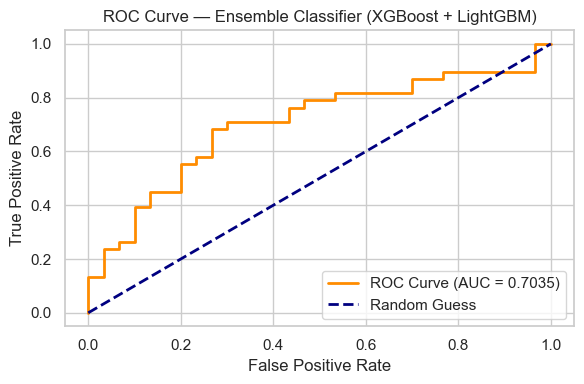


🎯 AUC Score (Ensemble): 0.7035


In [9]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, probs_ens)
auc_score = roc_auc_score(y_test, probs_ens)

# Plot ROC curve
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {auc_score:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve — Ensemble Classifier (XGBoost + LightGBM)')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

print(f"\n🎯 AUC Score (Ensemble): {auc_score:.4f}")

In [10]:
# Get training predictions
xgb_train_probs = xgb_model.predict_proba(X_train)[:, 1]
lgbm_train_probs = lgbm_model.predict_proba(X_train)[:, 1]

# Combine training probabilities using same soft voting ratio
combined_train_probs = 0.2 * xgb_train_probs + 0.8 * lgbm_train_probs

# Use same threshold as optimized for test set
y_train_pred = (combined_train_probs >= best_thresh).astype(int)

# Training performance
print("\n📊 Training Set Evaluation (Ensemble):")
print(confusion_matrix(y_train, y_train_pred))
print(classification_report(y_train, y_train_pred, digits=4))


📊 Training Set Evaluation (Ensemble):
[[ 86  18]
 [  9 175]]
              precision    recall  f1-score   support

           0     0.9053    0.8269    0.8643       104
           1     0.9067    0.9511    0.9284       184

    accuracy                         0.9062       288
   macro avg     0.9060    0.8890    0.8964       288
weighted avg     0.9062    0.9062    0.9052       288



In [11]:
from imblearn.ensemble import BalancedBaggingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support
import numpy as np

# Define base estimator
base_xgb = XGBClassifier(
    objective='binary:logistic',
    use_label_encoder=False,
    eval_metric='logloss',
    learning_rate=0.001,
    max_depth=50,
    n_estimators=500,
    subsample=1.0,
    colsample_bytree=1.0,
    random_state=42,
    reg_alpha=2, reg_lambda=1
)

# Use BalancedBaggingClassifier instead of EasyEnsembleClassifier
balanced_bagging_model = BalancedBaggingClassifier(
    estimator=base_xgb,      
    n_estimators=100,
    sampling_strategy='auto',
    replacement=False,
    random_state=42,
    n_jobs=-1,
    bootstrap=True,  # Enable bootstrap sampling
    bootstrap_features=False,  # Do not bootstrap features
    max_samples=1.0,  # Use all samples in each bootstrap sample     
    max_features=1.0  # Use all features in each bootstrap sample
)

# Train model
balanced_bagging_model.fit(X_train, y_train)

# Predict probabilities
probs_balanced = balanced_bagging_model.predict_proba(X_test)[:, 1]

# Threshold tuning
best_recall_1 = 0.5
best_thresh = 0.5

for thresh in np.linspace(0.1, 0.9, 20000):
    y_pred_thresh = (probs_balanced >= thresh).astype(int)
    precision, recall, f1, _ = precision_recall_fscore_support(
        y_test, y_pred_thresh, average=None, labels=[0, 1]
    )
    recall_0, recall_1 = recall
    if recall_1 > best_recall_1 and recall_0 >= 0.6:
        best_recall_1 = recall_1
        best_thresh = thresh

# Final predictions
y_pred_final = (probs_balanced >= best_thresh).astype(int)

print(f"\n✅ Optimal Threshold: {best_thresh:.4f} — Recall (Class 1): {best_recall_1:.4f}")
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_final))
print("\nClassification Report:\n", classification_report(y_test, y_pred_final))

print(f"\n🎯 AUC Score (Ensemble): {auc_score:.4f}")

c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif


✅ Optimal Threshold: 0.4733 — Recall (Class 1): 0.7105

Confusion Matrix:
 [[18 12]
 [11 27]]

Classification Report:
               precision    recall  f1-score   support

           0       0.62      0.60      0.61        30
           1       0.69      0.71      0.70        38

    accuracy                           0.66        68
   macro avg       0.66      0.66      0.66        68
weighted avg       0.66      0.66      0.66        68


🎯 AUC Score (Ensemble): 0.7035


c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif

In [12]:
# import numpy as np
# import pandas as pd
# from lightgbm import LGBMClassifier
# from imblearn.ensemble import BalancedBaggingClassifier
# from sklearn.model_selection import RandomizedSearchCV
# from sklearn.metrics import classification_report, roc_auc_score, roc_curve, confusion_matrix
# import matplotlib.pyplot as plt


# # --------------------------
# # 2. Define Base Estimator and Param Grid
# # --------------------------
# base_estimator = LGBMClassifier(objective='binary', class_weight='balanced', random_state=42)

# param_dist = {
#     # LGBM Parameters
#     'estimator__learning_rate': [0.005, 0.01, 0.05],
#     'estimator__n_estimators': [750, 800, 850],
#     'estimator__max_depth': [20, 30, 40],
#     'estimator__num_leaves': [21, 31, 41],
#     'estimator__subsample': [0.7, 0.8, 1.0],
#     'estimator__colsample_bytree': [0.7, 0.8, 1.0],
#     'estimator__reg_alpha': [0, 1, 2],
#     'estimator__reg_lambda': [2, 3, 4],
    
#     # Bagging Parameters
#     'n_estimators': [40, 50, 60],
#     'max_samples': [0.6, 0.8, 1.0],
#     'bootstrap': [True, False]
# }

# # --------------------------
# # 3. Wrap Base Estimator in BalancedBaggingClassifier
# # --------------------------
# bbc = BalancedBaggingClassifier(
#     estimator=base_estimator,
#     random_state=42,
#     n_jobs=-1
# )

# # --------------------------
# # 4. Run RandomizedSearchCV
# # --------------------------
# search = RandomizedSearchCV(
#     estimator=bbc,
#     param_distributions=param_dist,
#     n_iter=20,
#     cv=3,
#     scoring='roc_auc',
#     verbose=1,
#     random_state=42,
#     n_jobs=-1
# )

# search.fit(X_train, y_train)
# best_model = search.best_estimator_

# print(f"✅ Best Parameters:\n{search.best_params_}")

# # --------------------------
# # 5. Evaluate on Test Set
# # --------------------------
# probs_bal = best_model.predict_proba(X_test)[:, 1]
# y_pred_bal = (probs_bal >= 0.5).astype(int)

# print("\nClassification Report:\n", classification_report(y_test, y_pred_bal))
# print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_bal))
# print(f"\nAUC Score: {roc_auc_score(y_test, probs_bal):.4f}")

# # --------------------------
# # 6. Plot ROC Curve
# # --------------------------
# fpr, tpr, _ = roc_curve(y_test, probs_bal)
# auc_score = roc_auc_score(y_test, probs_bal)

# plt.figure(figsize=(6, 4))
# plt.plot(fpr, tpr, lw=2, color='darkorange', label=f'ROC Curve (AUC = {auc_score:.4f})')
# plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')
# plt.title('ROC Curve — Tuned BalancedBaggingClassifier')
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.legend(loc='lower right')
# plt.grid(True)
# plt.tight_layout()
# plt.show()


In [ ]:
from imblearn.ensemble import BalancedBaggingClassifier
from lightgbm import LGBMClassifier
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support
from hyperopt import fmin, tpe, hp, Trials, STATUS_OK
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ----------------------
# 1. Define search space
# ----------------------
space = {
    'learning_rate': hp.uniform('learning_rate', 0.0005, 0.01),
    'n_estimators': hp.choice('n_estimators', [300, 500, 750, 1000]),
    'max_depth': hp.choice('max_depth', [20, 50, 100, 200]),
    'subsample': hp.uniform('subsample', 0.7, 1.0),
    'colsample_bytree': hp.uniform('colsample_bytree', 0.7, 1.0),
    'reg_alpha': hp.uniform('reg_alpha', 0, 5),
    'reg_lambda': hp.uniform('reg_lambda', 0, 5)
}

# ----------------------
# 2. Define objective function
# ----------------------
def objective(params):
    model = LGBMClassifier(
        objective='binary',
        learning_rate=params['learning_rate'],
        n_estimators=params['n_estimators'],
        max_depth=params['max_depth'],
        subsample=params['subsample'],
        colsample_bytree=params['colsample_bytree'],
        reg_alpha=params['reg_alpha'],
        reg_lambda=params['reg_lambda'],
        random_state=42,
        n_jobs=-1
    )

    bagging_model = BalancedBaggingClassifier(
        estimator=model,
        n_estimators=50,
        sampling_strategy='auto',
        random_state=42,
        n_jobs=-1,
        bootstrap=True,
        max_samples=1.0,
        max_features=1.0,
        replacement=False
    )

    bagging_model.fit(X_train, y_train)
    probs = bagging_model.predict_proba(X_test)[:, 1]
    preds = (probs >= 0.5).astype(int)
    _, recall, _, _ = precision_recall_fscore_support(y_test, preds, average=None, labels=[0, 1])

    # Objective: maximize recall for class 1 while keeping recall for class 0 ≥ 0.65
    recall_0, recall_1 = recall
    if recall_0 < 0.65:
        return {'loss': 1.0 - recall_1 + 1.0, 'status': STATUS_OK}  # penalize
    return {'loss': 1.0 - recall_1, 'status': STATUS_OK}

# ----------------------
# 3. Run Hyperopt
# ----------------------
trials = Trials()
best = fmin(fn=objective, space=space, algo=tpe.suggest, max_evals=50, trials=trials, rstate=np.random.default_rng(42))
print("\n✅ Best Hyperparameters:", best)

# Map index choices to actual values
n_estimators_vals = [300, 500, 750, 1000]
max_depth_vals = [20, 50, 100, 200]
best['n_estimators'] = n_estimators_vals[best['n_estimators']]
best['max_depth'] = max_depth_vals[best['max_depth']]

# ----------------------
# 4. Train final model
# ----------------------
final_lgbm = LGBMClassifier(
    objective='binary',
    learning_rate=best['learning_rate'],
    n_estimators=best['n_estimators'],
    max_depth=best['max_depth'],
    subsample=best['subsample'],
    colsample_bytree=best['colsample_bytree'],
    reg_alpha=best['reg_alpha'],
    reg_lambda=best['reg_lambda'],
    random_state=42,
    n_jobs=-1
)

balanced_bagging_model = BalancedBaggingClassifier(
    estimator=final_lgbm,
    n_estimators=100,
    sampling_strategy='auto',
    random_state=42,
    n_jobs=-1,
    bootstrap=True,
    max_samples=1.0,
    max_features=1.0,
    replacement=False
)

balanced_bagging_model.fit(X_train, y_train)
probs_bal = balanced_bagging_model.predict_proba(X_test)[:, 1]

# ----------------------
# 5. Threshold tuning
# ----------------------
best_recall_1 = 0.6
best_thresh = 0.5

for thresh in np.linspace(0.1, 0.9, 20000):
    y_pred_thresh = (probs_bal >= thresh).astype(int)
    precision, recall, _, _ = precision_recall_fscore_support(
        y_test, y_pred_thresh, average=None, labels=[0, 1]
    )
    recall_0, recall_1 = recall
    if recall_1 > best_recall_1 and recall_0 >= 0.65:
        best_recall_1 = recall_1
        best_thresh = thresh

# Final predictions
y_pred_bal = (probs_bal >= best_thresh).astype(int)

# ----------------------
# 6. Evaluation
# ----------------------
print(f"\n✅ Optimal Threshold: {best_thresh:.4f} — Recall (Class 1): {best_recall_1:.4f}")
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_bal))
print("\nClassification Report:\n", classification_report(y_test, y_pred_bal))

# Confusion matrix plot
cm = confusion_matrix(y_test, y_pred_bal)
labels = ['Normal (0)', 'Risky (1)']
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.title('Confusion Matrix — Tuned BalancedBaggingClassifier')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.tight_layout()
plt.show()

  0%|          | 0/50 [00:00<?, ?trial/s, best loss=?]


AttributeError: 'numpy.random.mtrand.RandomState' object has no attribute 'integers'

c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
2 fits failed out of a total of 30.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
2 fits failed with the following error:
joblib.externals.loky.process_executor._RemoteTraceback: 
"""
Traceback (most recent call last):
  File "c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\joblib\_utils.py", line 72, in __call__
    return self.func(**kwargs)
  File "c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\joblib\parallel.py", line 598, in __call__
    return [func(*args, **kwargs)
  File "c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\job

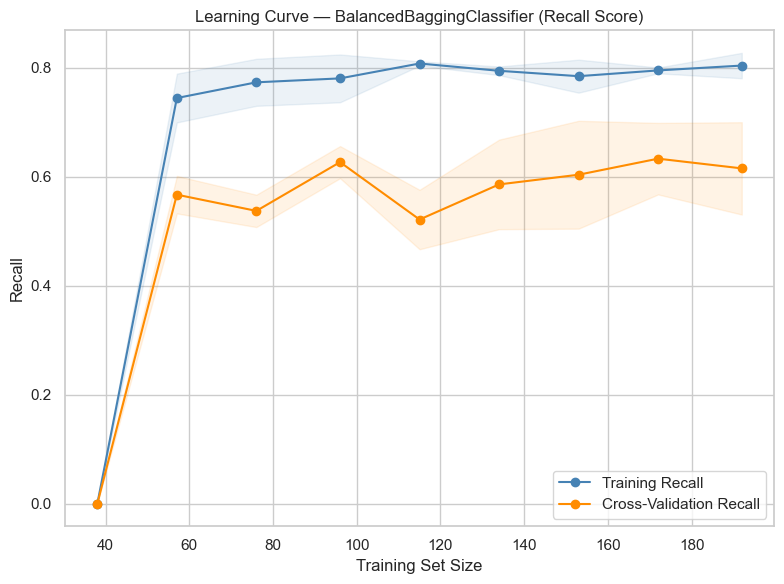

In [ ]:
# from sklearn.model_selection import learning_curve
# from sklearn.metrics import make_scorer, recall_score
# import matplotlib.pyplot as plt
# import numpy as np

# # Define a custom scorer to focus on recall for class 1
# recall_1_scorer = make_scorer(recall_score, average=None)

# # Calculate learning curve
# train_sizes, train_scores, test_scores = learning_curve(
#     estimator=balanced_bagging_model,
#     X=X_train,
#     y=y_train,
#     cv=3,
#     scoring='f1',  # You can switch to 'f1', 'accuracy', or use recall_1_scorer
#     train_sizes=np.linspace(0.1, 1.0, 10),
#     n_jobs=-1,
#     shuffle=True,
#     random_state=42
# )

# # Compute mean and std for plotting
# train_scores_mean = np.mean(train_scores, axis=1)
# train_scores_std  = np.std(train_scores, axis=1)
# test_scores_mean  = np.mean(test_scores, axis=1)
# test_scores_std   = np.std(test_scores, axis=1)

# # Plotting
# plt.figure(figsize=(8, 6))
# plt.plot(train_sizes, train_scores_mean, 'o-', color='steelblue', label='Training Recall')
# plt.plot(train_sizes, test_scores_mean, 'o-', color='darkorange', label='Cross-Validation Recall')
# plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
#                  train_scores_mean + train_scores_std, alpha=0.1, color='steelblue')
# plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
#                  test_scores_mean + test_scores_std, alpha=0.1, color='darkorange')

# plt.title('Learning Curve — BalancedBaggingClassifier (Recall Score)')
# plt.xlabel('Training Set Size')
# plt.ylabel('Recall')
# plt.legend(loc='lower right')
# plt.grid(True)
# plt.tight_layout()
# plt.show() 

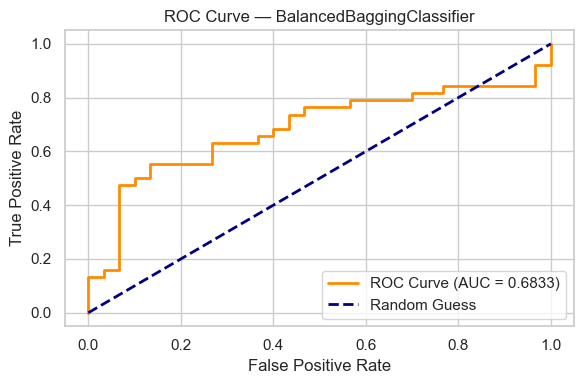


🎯 AUC Score: 0.6833


In [39]:
from sklearn.metrics import roc_curve, roc_auc_score

# Calculate ROC curve and AUC
fpr, tpr, thresholds = roc_curve(y_test, probs_bal)
auc_score = roc_auc_score(y_test, probs_bal)

# Plot ROC curve
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {auc_score:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve — BalancedBaggingClassifier')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

print(f"\n🎯 AUC Score: {auc_score:.4f}")


c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\User\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1517: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modif


✅ EasyEnsembleClassifier — Optimal Threshold: 0.4931

Confusion Matrix:
 [[18 12]
 [16 22]]

Classification Report:
               precision    recall  f1-score   support

           0       0.53      0.60      0.56        30
           1       0.65      0.58      0.61        38

    accuracy                           0.59        68
   macro avg       0.59      0.59      0.59        68
weighted avg       0.60      0.59      0.59        68



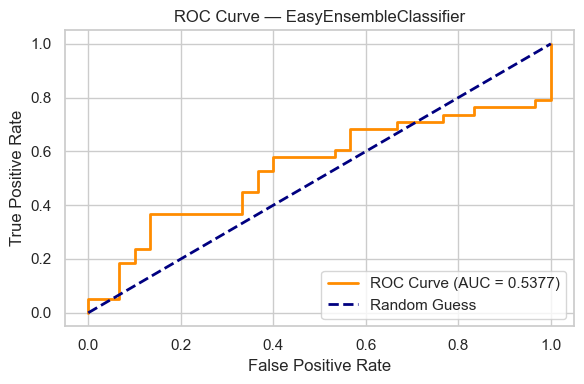


🎯 AUC Score: 0.5377


In [16]:
from imblearn.ensemble import EasyEnsembleClassifier
from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline

# Create imputer to fill NaNs (you can choose 'mean', 'median', or 'most_frequent')
imputer = SimpleImputer(strategy='mean')

# Impute training and testing data
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)


# Step 1: Initialize EasyEnsembleClassifier with default base (DecisionTree)
easy_model = EasyEnsembleClassifier(
    n_estimators=1000,
    random_state=42,
    n_jobs=-1,
    sampling_strategy='auto',
    replacement=False,        
)

# Step 2: Fit model
easy_model.fit(X_train_imputed, y_train)

# Step 3: Predict probabilities and apply threshold tuning
probs_easy = easy_model.predict_proba(X_test_imputed)[:, 1]

# Step 4: Threshold tuning to maximize recall for class 1 (risky)
best_recall_1 = 0.5
best_thresh = 0.5

for thresh in np.linspace(0.1, 0.9, 20000):
    y_pred_thresh = (probs_easy >= thresh).astype(int)
    precision, recall, f1, _ = precision_recall_fscore_support(
        y_test, y_pred_thresh, average=None, labels=[0, 1]
    )
    recall_0, recall_1 = recall
    if recall_1 > best_recall_1 and recall_0 >= 0.60:
        best_recall_1 = recall_1
        best_thresh = thresh

# Step 5: Final prediction and evaluation
y_pred_easy = (probs_easy >= best_thresh).astype(int)

print(f"\n✅ EasyEnsembleClassifier — Optimal Threshold: {best_thresh:.4f}")
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred_easy))
print("\nClassification Report:\n", classification_report(y_test, y_pred_easy))

from sklearn.metrics import roc_curve, roc_auc_score

# Calculate ROC curve
fpr, tpr, thresholds = roc_curve(y_test, probs_easy)
auc_score = roc_auc_score(y_test, probs_easy)

# Plot ROC curve
plt.figure(figsize=(6, 4))
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC Curve (AUC = {auc_score:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label='Random Guess')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve — EasyEnsembleClassifier')
plt.legend(loc="lower right")
plt.grid(True)
plt.tight_layout()
plt.show()

print(f"\n🎯 AUC Score: {auc_score:.4f}")

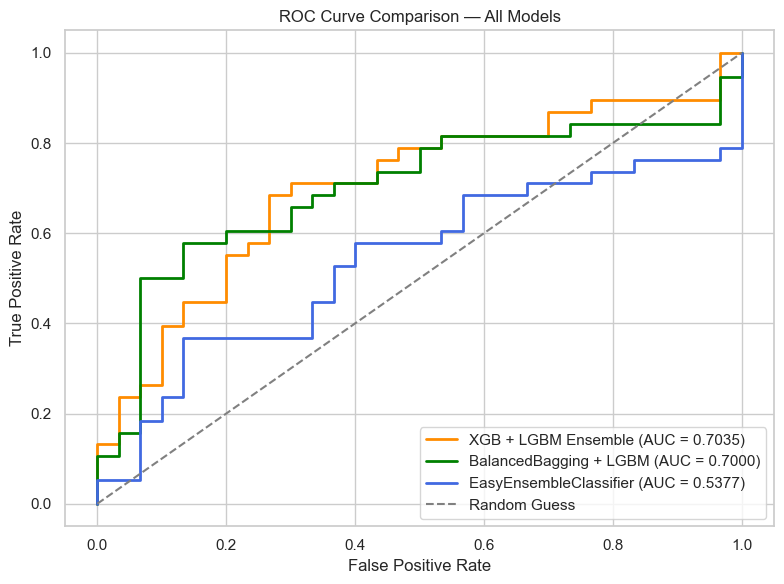

In [17]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# === Model 1: Ensemble Classifier (XGB + LGBM)
fpr1, tpr1, _ = roc_curve(y_test, probs_ens)
auc1 = roc_auc_score(y_test, probs_ens)

# === Model 2: BalancedBaggingClassifier + LGBM
fpr2, tpr2, _ = roc_curve(y_test, probs_bal)
auc2 = roc_auc_score(y_test, probs_bal)

# === Model 3: EasyEnsembleClassifier
fpr3, tpr3, _ = roc_curve(y_test, probs_easy)
auc3 = roc_auc_score(y_test, probs_easy)

# === Combined ROC Plot
plt.figure(figsize=(8, 6))
plt.plot(fpr1, tpr1, lw=2, label=f'XGB + LGBM Ensemble (AUC = {auc1:.4f})', color='darkorange')
plt.plot(fpr2, tpr2, lw=2, label=f'BalancedBagging + LGBM (AUC = {auc2:.4f})', color='green')
plt.plot(fpr3, tpr3, lw=2, label=f'EasyEnsembleClassifier (AUC = {auc3:.4f})', color='royalblue')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Guess')

plt.title('ROC Curve Comparison — All Models')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')
plt.grid(True)
plt.tight_layout()
plt.show()


In [18]:
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score, roc_auc_score,
    classification_report
)
import pandas as pd

# === Example predictions/probabilities for each model
# y_test: true labels
# y_pred_ens, y_pred_bal, y_pred_easy: predicted labels (thresholded)
# probs_ens, probs_bal, probs_easy: predicted probabilities for class 1

model_metrics = []

def evaluate_model(name, y_true, y_pred, y_probs):
    # Macro metrics
    acc = accuracy_score(y_true, y_pred)
    prec = precision_score(y_true, y_pred, average='macro')
    rec = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    auc = roc_auc_score(y_true, y_probs)

    # Class-specific recall
    report = classification_report(y_true, y_pred, output_dict=True)
    recall_0 = report['0']['recall']
    recall_1 = report['1']['recall']

    # Append to list
    model_metrics.append({
        'Model': name,
        'Accuracy(Macro)': f"{acc:.2f}",
        'Precision(Macro)': f"{prec:.2f}",
        'Recall(Macro)': f"{rec:.2f}",
        'F1(Macro)': f"{f1:.2f}",
        'ROC-AUC': f"{auc:.2f}",
        'Recall (Class 0)': f"{recall_0:.2f}",
        'Recall (Class 1)': f"{recall_1:.2f}",
    })


# === Call for each model
evaluate_model("XGB + LGBM Ensemble", y_test, y_pred_ens, probs_ens)
evaluate_model("BalancedBagging + LGBM", y_test, y_pred_bal, probs_bal)
evaluate_model("EasyEnsembleClassifier", y_test, y_pred_easy, probs_easy)

# === Convert to DataFrame and display
df_metrics = pd.DataFrame(model_metrics)
print(df_metrics.to_string(index=False))

# Save to Excel file
df_metrics.to_excel("model_evaluation_metrics.xlsx", index=False)

print("📄 Model metrics saved to 'model_evaluation_metrics.xlsx'")



                 Model Accuracy(Macro) Precision(Macro) Recall(Macro) F1(Macro) ROC-AUC Recall (Class 0) Recall (Class 1)
   XGB + LGBM Ensemble            0.66             0.66          0.66      0.66    0.70             0.60             0.71
BalancedBagging + LGBM            0.66             0.66          0.66      0.66    0.70             0.60             0.71
EasyEnsembleClassifier            0.59             0.59          0.59      0.59    0.54             0.60             0.58
📄 Model metrics saved to 'model_evaluation_metrics.xlsx'
